In [27]:
from __future__ import print_function, division

from keras.layers import Input, Dense, Flatten, Dropout, Reshape, Concatenate,Layer
from keras.layers import BatchNormalization, Activation, Conv2D, Conv2DTranspose
from keras.layers.advanced_activations import LeakyReLU,ReLU
from keras.constraints import Constraint
from keras.models import Model,load_model,save_model
from keras.optimizers import Adam
#from keras.models import load_weights,save_weights

from keras.datasets import cifar10
from keras import backend as K
from keras.callbacks import TensorBoard

from keras.preprocessing import image
import os
import os.path as path


import matplotlib.pyplot as plt

import sys
import numpy as np

%pylab inline

Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python2.7/dist-packages/IPython/core/magics/pylab.py:161: UserWarning: pylab import has clobbered these variables: ['real', 'e']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


# References
https://github.com/IShengFang/SpectralNormalizationKeras
https://medium.com/@utk.is.here/training-a-conditional-dc-gan-on-cifar-10-fce88395d610
https://stackoverflow.com/questions/50819931/self-attention-gan-in-keras
https://medium.com/@jonathan_hui/gan-self-attention-generative-adversarial-networks-sagan-923fccde790c

In [2]:
#from google.colab import drive
#drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
def one_hot_encode(y):
  z = np.zeros((len(y), 10))
  idx = np.arange(len(y))
  z[idx, y] = 1
  return z

def generate_noise(n_samples, noise_dim):
  X = np.random.normal(0, 1, size=(n_samples, noise_dim))
  return X

def generate_random_labels(n):
  y = np.random.choice(10, n)
  y = one_hot_encode(y)
  return y

In [4]:
classes = ['Airplane', 'Automobile', 'Bird', 'Cat', 'Deer', 'Dog', 'Frog', 'Horse', 'Ship', 'Truck']
(X_train,Y_train),(X_test,Y_test)=cifar10.load_data()
num_classes=len(np.unique(Y_train))
X_train = (X_train - 127.5) / 127.5
X_test=(X_test - 127.5) / 127.5
Y_train = one_hot_encode(Y_train[:,0])
Y_test = one_hot_encode(Y_test[:,0])
print(X_train.shape)
print(X_test.shape)

(50000, 32, 32, 3)
(10000, 32, 32, 3)


In [0]:
class Attention(Layer):
    def __init__(self, ch, **kwargs):
        super(Attention, self).__init__(**kwargs)
        self.channels = ch
        self.filters_f_g = self.channels // 8
        self.filters_h = self.channels

    def build(self, input_shape):
        kernel_shape_f_g = (1, 1) + (self.channels, self.filters_f_g)
        print(kernel_shape_f_g)
        kernel_shape_h = (1, 1) + (self.channels, self.filters_h)

        self.gamma = self.add_weight(name='gamma', shape=[1], initializer='zeros', trainable=True)
        self.kernel_f = self.add_weight(shape=kernel_shape_f_g,
                                        initializer='glorot_uniform',
                                        name='kernel_f')
        self.kernel_g = self.add_weight(shape=kernel_shape_f_g,
                                        initializer='glorot_uniform',
                                        name='kernel_g')
        self.kernel_h = self.add_weight(shape=kernel_shape_h,
                                        initializer='glorot_uniform',
                                        name='kernel_h')
        self.bias_f = self.add_weight(shape=(self.filters_f_g,),
                                      initializer='zeros',
                                      name='bias_F')
        self.bias_g = self.add_weight(shape=(self.filters_f_g,),
                                      initializer='zeros',
                                      name='bias_g')
        self.bias_h = self.add_weight(shape=(self.filters_h,),
                                      initializer='zeros',
                                      name='bias_h')
        super(Attention, self).build(input_shape)
 
        self.input_spec = InputSpec(ndim=4,
                                    axes={3: input_shape[-1]})
        self.built = True


    def call(self, x):
        def hw_flatten(x):
            return K.reshape(x, shape=[K.shape(x)[0], K.shape(x)[1]*K.shape(x)[2], K.shape(x)[-1]])

        f = K.conv2d(x,
                     kernel=self.kernel_f,
                     strides=(1, 1), padding='same')  # [bs, h, w, c']
        f = K.bias_add(f, self.bias_f)
        g = K.conv2d(x,
                     kernel=self.kernel_g,
                     strides=(1, 1), padding='same')  # [bs, h, w, c']
        g = K.bias_add(g, self.bias_g)
        h = K.conv2d(x,
                     kernel=self.kernel_h,
                     strides=(1, 1), padding='same')  # [bs, h, w, c]
        h = K.bias_add(h, self.bias_h)

        s = tf.matmul(hw_flatten(g), hw_flatten(f), transpose_b=True)  # # [bs, N, N]

        beta = K.softmax(s, axis=-1)  # attention map

        o = K.batch_dot(beta, hw_flatten(h))  # [bs, N, C]

        o = K.reshape(o, shape=K.shape(x))  # [bs, h, w, C]
        x = self.gamma * o + x

        return x

    def compute_output_shape(self, input_shape):
        return input_shape

def hw_flatten(x):
    return K.reshape(x, shape=[K.shape(x)[0], K.shape(x)[1]*K.shape(x)[2], K.shape(x)[3]])

In [0]:
from keras import backend as K
from keras.engine import *
from keras.legacy import interfaces
from keras import activations
from keras import initializers
from keras import regularizers
from keras import constraints
from keras.utils.generic_utils import func_dump
from keras.utils.generic_utils import func_load
from keras.utils.generic_utils import deserialize_keras_object
from keras.utils.generic_utils import has_arg
from keras.utils import conv_utils
from keras.legacy import interfaces
from keras.layers import Dense, Conv1D, Conv2D, Conv3D, Conv2DTranspose, Embedding
import tensorflow as tf

class DenseSN(Dense):
    def build(self, input_shape):
        assert len(input_shape) >= 2
        input_dim = input_shape[-1]
        self.kernel = self.add_weight(shape=(input_dim, self.units),
                                      initializer=self.kernel_initializer,
                                      name='kernel',
                                      regularizer=self.kernel_regularizer,
                                      constraint=self.kernel_constraint)
        if self.use_bias:
            self.bias = self.add_weight(shape=(self.units,),
                                        initializer=self.bias_initializer,
                                        name='bias',
                                        regularizer=self.bias_regularizer,
                                        constraint=self.bias_constraint)
        else:
            self.bias = None
        self.u = self.add_weight(shape=tuple([1, self.kernel.shape.as_list()[-1]]),
                                 initializer=initializers.RandomNormal(0, 1),
                                 name='sn',
                                 trainable=False)
        self.input_spec = InputSpec(min_ndim=2, axes={-1: input_dim})
        self.built = True
        
    def call(self, inputs, training=None):
        def _l2normalize(v, eps=1e-12):
            return v / (K.sum(v ** 2) ** 0.5 + eps)
        def power_iteration(W, u):
            _u = u
            _v = _l2normalize(K.dot(_u, K.transpose(W)))
            _u = _l2normalize(K.dot(_v, W))
            return _u, _v
        W_shape = self.kernel.shape.as_list()
        #Flatten the Tensor
        W_reshaped = K.reshape(self.kernel, [-1, W_shape[-1]])
        _u, _v = power_iteration(W_reshaped, self.u)
        #Calculate Sigma
        sigma=K.dot(_v, W_reshaped)
        sigma=K.dot(sigma, K.transpose(_u))
        #normalize it
        W_bar = W_reshaped / sigma
        #reshape weight tensor
        if training in {0, False}:
            W_bar = K.reshape(W_bar, W_shape)
        else:
            with tf.control_dependencies([self.u.assign(_u)]):
                 W_bar = K.reshape(W_bar, W_shape)  
        output = K.dot(inputs, W_bar)
        if self.use_bias:
            output = K.bias_add(output, self.bias, data_format='channels_last')
        if self.activation is not None:
            output = self.activation(output)
        return output 
        
class _ConvSN(Layer):

    def __init__(self, rank,
                 filters,
                 kernel_size,
                 strides=1,
                 padding='valid',
                 data_format=None,
                 dilation_rate=1,
                 activation=None,
                 use_bias=True,
                 kernel_initializer='glorot_uniform',
                 bias_initializer='zeros',
                 kernel_regularizer=None,
                 bias_regularizer=None,
                 activity_regularizer=None,
                 kernel_constraint=None,
                 bias_constraint=None,
                 spectral_normalization=True,
                 **kwargs):
        super(_ConvSN, self).__init__(**kwargs)
        self.rank = rank
        self.filters = filters
        self.kernel_size = conv_utils.normalize_tuple(kernel_size, rank, 'kernel_size')
        self.strides = conv_utils.normalize_tuple(strides, rank, 'strides')
        self.padding = conv_utils.normalize_padding(padding)
        self.data_format = conv_utils.normalize_data_format(data_format)
        self.dilation_rate = conv_utils.normalize_tuple(dilation_rate, rank, 'dilation_rate')
        self.activation = activations.get(activation)
        self.use_bias = use_bias
        self.kernel_initializer = initializers.get(kernel_initializer)
        self.bias_initializer = initializers.get(bias_initializer)
        self.kernel_regularizer = regularizers.get(kernel_regularizer)
        self.bias_regularizer = regularizers.get(bias_regularizer)
        self.activity_regularizer = regularizers.get(activity_regularizer)
        self.kernel_constraint = constraints.get(kernel_constraint)
        self.bias_constraint = constraints.get(bias_constraint)
        self.input_spec = InputSpec(ndim=self.rank + 2)
        self.spectral_normalization = spectral_normalization
        self.u = None
        
    def _l2normalize(self, v, eps=1e-12):
        return v / (K.sum(v ** 2) ** 0.5 + eps)
    
    def power_iteration(self, u, W):
        '''
        Accroding the paper, we only need to do power iteration one time.
        '''
        v = self._l2normalize(K.dot(u, K.transpose(W)))
        u = self._l2normalize(K.dot(v, W))
        return u, v
    def build(self, input_shape):
        if self.data_format == 'channels_first':
            channel_axis = 1
        else:
            channel_axis = -1
        if input_shape[channel_axis] is None:
            raise ValueError('The channel dimension of the inputs '
                             'should be defined. Found `None`.')
        input_dim = input_shape[channel_axis]
        kernel_shape = self.kernel_size + (input_dim, self.filters)

        self.kernel = self.add_weight(shape=kernel_shape,
                                      initializer=self.kernel_initializer,
                                      name='kernel',
                                      regularizer=self.kernel_regularizer,
                                      constraint=self.kernel_constraint)

        #Spectral Normalization
        if self.spectral_normalization:
            self.u = self.add_weight(shape=tuple([1, self.kernel.shape.as_list()[-1]]),
                                     initializer=initializers.RandomNormal(0, 1),
                                     name='sn',
                                     trainable=False)
        
        if self.use_bias:
            self.bias = self.add_weight(shape=(self.filters,),
                                        initializer=self.bias_initializer,
                                        name='bias',
                                        regularizer=self.bias_regularizer,
                                        constraint=self.bias_constraint)
        else:
            self.bias = None
        # Set input spec.
        self.input_spec = InputSpec(ndim=self.rank + 2,
                                    axes={channel_axis: input_dim})
        self.built = True

    def call(self, inputs):
        def _l2normalize(v, eps=1e-12):
            return v / (K.sum(v ** 2) ** 0.5 + eps)
        def power_iteration(W, u):
            _u = u
            _v = _l2normalize(K.dot(_u, K.transpose(W)))
            _u = _l2normalize(K.dot(_v, W))
            return _u, _v
        
        if self.spectral_normalization:
            W_shape = self.kernel.shape.as_list()
            #Flatten the Tensor
            W_reshaped = K.reshape(self.kernel, [-1, W_shape[-1]])
            _u, _v = power_iteration(W_reshaped, self.u)
            #Calculate Sigma
            sigma=K.dot(_v, W_reshaped)
            sigma=K.dot(sigma, K.transpose(_u))
            #normalize it
            W_bar = W_reshaped / sigma
            #reshape weight tensor
            if training in {0, False}:
                W_bar = K.reshape(W_bar, W_shape)
            else:
                with tf.control_dependencies([self.u.assign(_u)]):
                    W_bar = K.reshape(W_bar, W_shape)

            #update weitht
            self.kernel = W_bar
        
        if self.rank == 1:
            outputs = K.conv1d(
                inputs,
                self.kernel,
                strides=self.strides[0],
                padding=self.padding,
                data_format=self.data_format,
                dilation_rate=self.dilation_rate[0])
        if self.rank == 2:
            outputs = K.conv2d(
                inputs,
                self.kernel,
                strides=self.strides,
                padding=self.padding,
                data_format=self.data_format,
                dilation_rate=self.dilation_rate)
        if self.rank == 3:
            outputs = K.conv3d(
                inputs,
                self.kernel,
                strides=self.strides,
                padding=self.padding,
                data_format=self.data_format,
                dilation_rate=self.dilation_rate)

        if self.use_bias:
            outputs = K.bias_add(
                outputs,
                self.bias,
                data_format=self.data_format)

        if self.activation is not None:
            return self.activation(outputs)
        return outputs

    def compute_output_shape(self, input_shape):
        if self.data_format == 'channels_last':
            space = input_shape[1:-1]
            new_space = []
            for i in range(len(space)):
                new_dim = conv_utils.conv_output_length(
                    space[i],
                    self.kernel_size[i],
                    padding=self.padding,
                    stride=self.strides[i],
                    dilation=self.dilation_rate[i])
                new_space.append(new_dim)
            return (input_shape[0],) + tuple(new_space) + (self.filters,)
        if self.data_format == 'channels_first':
            space = input_shape[2:]
            new_space = []
            for i in range(len(space)):
                new_dim = conv_utils.conv_output_length(
                    space[i],
                    self.kernel_size[i],
                    padding=self.padding,
                    stride=self.strides[i],
                    dilation=self.dilation_rate[i])
                new_space.append(new_dim)
            return (input_shape[0], self.filters) + tuple(new_space)

    def get_config(self):
        config = {
            'rank': self.rank,
            'filters': self.filters,
            'kernel_size': self.kernel_size,
            'strides': self.strides,
            'padding': self.padding,
            'data_format': self.data_format,
            'dilation_rate': self.dilation_rate,
            'activation': activations.serialize(self.activation),
            'use_bias': self.use_bias,
            'kernel_initializer': initializers.serialize(self.kernel_initializer),
            'bias_initializer': initializers.serialize(self.bias_initializer),
            'kernel_regularizer': regularizers.serialize(self.kernel_regularizer),
            'bias_regularizer': regularizers.serialize(self.bias_regularizer),
            'activity_regularizer': regularizers.serialize(self.activity_regularizer),
            'kernel_constraint': constraints.serialize(self.kernel_constraint),
            'bias_constraint': constraints.serialize(self.bias_constraint)
        }
        base_config = super(_Conv, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))
    
class ConvSN2D(Conv2D):

    def build(self, input_shape):
        if self.data_format == 'channels_first':
            channel_axis = 1
        else:
            channel_axis = -1
        if input_shape[channel_axis] is None:
            raise ValueError('The channel dimension of the inputs '
                             'should be defined. Found `None`.')
        input_dim = input_shape[channel_axis]
        kernel_shape = self.kernel_size + (input_dim, self.filters)

        self.kernel = self.add_weight(shape=kernel_shape,
                                      initializer=self.kernel_initializer,
                                      name='kernel',
                                      regularizer=self.kernel_regularizer,
                                      constraint=self.kernel_constraint)

        if self.use_bias:
            self.bias = self.add_weight(shape=(self.filters,),
                                        initializer=self.bias_initializer,
                                        name='bias',
                                        regularizer=self.bias_regularizer,
                                        constraint=self.bias_constraint)
        else:
            self.bias = None
            
        self.u = self.add_weight(shape=tuple([1, self.kernel.shape.as_list()[-1]]),
                         initializer=initializers.RandomNormal(0, 1),
                         name='sn',
                         trainable=False)
        
        # Set input spec.
        self.input_spec = InputSpec(ndim=self.rank + 2,
                                    axes={channel_axis: input_dim})
        self.built = True
    def call(self, inputs, training=None):
        def _l2normalize(v, eps=1e-12):
            return v / (K.sum(v ** 2) ** 0.5 + eps)
        def power_iteration(W, u):
            #Accroding the paper, we only need to do power iteration one time.
            _u = u
            _v = _l2normalize(K.dot(_u, K.transpose(W)))
            _u = _l2normalize(K.dot(_v, W))
            return _u, _v
        #Spectral Normalization
        W_shape = self.kernel.shape.as_list()
        #Flatten the Tensor
        W_reshaped = K.reshape(self.kernel, [-1, W_shape[-1]])
        _u, _v = power_iteration(W_reshaped, self.u)
        #Calculate Sigma
        sigma=K.dot(_v, W_reshaped)
        sigma=K.dot(sigma, K.transpose(_u))
        #normalize it
        W_bar = W_reshaped / sigma
        #reshape weight tensor
        if training in {0, False}:
            W_bar = K.reshape(W_bar, W_shape)
        else:
            with tf.control_dependencies([self.u.assign(_u)]):
                W_bar = K.reshape(W_bar, W_shape)
                
        outputs = K.conv2d(
                inputs,
                W_bar,
                strides=self.strides,
                padding=self.padding,
                data_format=self.data_format,
                dilation_rate=self.dilation_rate)
        if self.use_bias:
            outputs = K.bias_add(
                outputs,
                self.bias,
                data_format=self.data_format)
        if self.activation is not None:
            return self.activation(outputs)
        return outputs
    
class ConvSN2DTranspose(Conv2DTranspose):

    def build(self, input_shape):
        if len(input_shape) != 4:
            raise ValueError('Inputs should have rank ' +
                             str(4) +
                             '; Received input shape:', str(input_shape))
        if self.data_format == 'channels_first':
            channel_axis = 1
        else:
            channel_axis = -1
        if input_shape[channel_axis] is None:
            raise ValueError('The channel dimension of the inputs '
                             'should be defined. Found `None`.')
        input_dim = input_shape[channel_axis]
        kernel_shape = self.kernel_size + (self.filters, input_dim)

        self.kernel = self.add_weight(shape=kernel_shape,
                                      initializer=self.kernel_initializer,
                                      name='kernel',
                                      regularizer=self.kernel_regularizer,
                                      constraint=self.kernel_constraint)
        if self.use_bias:
            self.bias = self.add_weight(shape=(self.filters,),
                                        initializer=self.bias_initializer,
                                        name='bias',
                                        regularizer=self.bias_regularizer,
                                        constraint=self.bias_constraint)
        else:
            self.bias = None
            
        self.u = self.add_weight(shape=tuple([1, self.kernel.shape.as_list()[-1]]),
                         initializer=initializers.RandomNormal(0, 1),
                         name='sn',
                         trainable=False)
        
        # Set input spec.
        self.input_spec = InputSpec(ndim=4, axes={channel_axis: input_dim})
        self.built = True  
    
    def call(self, inputs):
        input_shape = K.shape(inputs)
        batch_size = input_shape[0]
        if self.data_format == 'channels_first':
            h_axis, w_axis = 2, 3
        else:
            h_axis, w_axis = 1, 2

        height, width = input_shape[h_axis], input_shape[w_axis]
        kernel_h, kernel_w = self.kernel_size
        stride_h, stride_w = self.strides
        if self.output_padding is None:
            out_pad_h = out_pad_w = None
        else:
            out_pad_h, out_pad_w = self.output_padding

        # Infer the dynamic output shape:
        out_height = conv_utils.deconv_length(height,
                                              stride_h, kernel_h,
                                              self.padding,
                                              out_pad_h)
        out_width = conv_utils.deconv_length(width,
                                             stride_w, kernel_w,
                                             self.padding,
                                             out_pad_w)
        if self.data_format == 'channels_first':
            output_shape = (batch_size, self.filters, out_height, out_width)
        else:
            output_shape = (batch_size, out_height, out_width, self.filters)
            
        #Spectral Normalization    
        def _l2normalize(v, eps=1e-12):
            return v / (K.sum(v ** 2) ** 0.5 + eps)
        def power_iteration(W, u):
            #Accroding the paper, we only need to do power iteration one time.
            _u = u
            _v = _l2normalize(K.dot(_u, K.transpose(W)))
            _u = _l2normalize(K.dot(_v, W))
            return _u, _v
        W_shape = self.kernel.shape.as_list()
        #Flatten the Tensor
        W_reshaped = K.reshape(self.kernel, [-1, W_shape[-1]])
        _u, _v = power_iteration(W_reshaped, self.u)
        #Calculate Sigma
        sigma=K.dot(_v, W_reshaped)
        sigma=K.dot(sigma, K.transpose(_u))
        #normalize it
        W_bar = W_reshaped / sigma
        #reshape weight tensor
        if training in {0, False}:
            W_bar = K.reshape(W_bar, W_shape)
        else:
            with tf.control_dependencies([self.u.assign(_u)]):
                W_bar = K.reshape(W_bar, W_shape)
        self.kernel = W_bar
        
        outputs = K.conv2d_transpose(
            inputs,
            self.kernel,
            output_shape,
            self.strides,
            padding=self.padding,
            data_format=self.data_format)

        if self.use_bias:
            outputs = K.bias_add(
                outputs,
                self.bias,
                data_format=self.data_format)

        if self.activation is not None:
            return self.activation(outputs)
        return outputs

In [7]:
noise_input = Input(shape=(100,))
genearator_condition = Input(shape=(10,))
#img_input = Input(shape=(32,32,3))

def BuildGenerator():

  concat_layer = Concatenate()([noise_input, genearator_condition])
  
  model= Dense(2 * 2 * 512, activation='relu')(concat_layer)    
  model = BatchNormalization(momentum=0.9)(model)
  model = Reshape((2, 2, 512))(model)

  

  model = ConvSN2DTranspose(256,kernel_size= 4, strides=2, padding='same',activation='relu')(model)
  model = BatchNormalization(momentum=0.9)(model)
 

  model = ConvSN2DTranspose(128, 4, strides=2, padding='same',activation='relu')(model)
  model = BatchNormalization(momentum=0.9)(model)
  
  model = ConvSN2DTranspose(64, kernel_size=4, strides=2, padding='same',activation='relu')(model)
  model = BatchNormalization(momentum=0.9)(model)
  model = Attention(64)(model)
                      
  model = ConvSN2DTranspose(3, kernel_size=4, strides=2, padding="same")(model)
  outpt = Activation("tanh")(model)

  model_g = Model(inputs=[noise_input, genearator_condition], outputs=outpt)
  model_g.summary()
  
  return model_g, outpt


W1023 18:13:47.144308 140517859538816 module_wrapper.py:139] From /usr/local/lib/python2.7/dist-packages/keras/backend/tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W1023 18:13:47.146222 140517859538816 module_wrapper.py:139] From /usr/local/lib/python2.7/dist-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.



In [0]:
img_input = Input(shape=(32,32,3))
disc_condition= Input(shape=(10,))
def BuildDiscriminator():
  model = ConvSN2D(64, kernel_size=4, strides=2, padding='same')(img_input)
  model = BatchNormalization(momentum=0.9)(model)
  model = LeakyReLU(alpha=0.1)(model)
  model = Attention(64)(model)

  model = ConvSN2D(128, kernel_size=4, strides=2, padding='same')(model)
  model = BatchNormalization(momentum=0.9)(model)
  model = LeakyReLU(alpha=0.1)(model)
  

  model = ConvSN2D(256, kernel_size=4, strides=2, padding='same')(model)
  model = BatchNormalization(momentum=0.9)(model)
  model = LeakyReLU(alpha=0.1)(model)
  
  model = Flatten()(model)
  
  concat_layer = Concatenate()([model, disc_condition])
  model = Dense(512, activation='relu')(model)
 
  out = Dense(1, activation='linear')(model)

  model_d = Model(inputs=[img_input, disc_condition], outputs=out)

  model_d.summary()

  return model_d, out

In [9]:
generator, gen_out = BuildGenerator()

W1023 18:13:47.185816 140517859538816 module_wrapper.py:139] From /usr/local/lib/python2.7/dist-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W1023 18:13:47.267877 140517859538816 module_wrapper.py:139] From /usr/local/lib/python2.7/dist-packages/keras/backend/tensorflow_backend.py:133: The name tf.placeholder_with_default is deprecated. Please use tf.compat.v1.placeholder_with_default instead.

W1023 18:13:47.301656 140517859538816 module_wrapper.py:139] From /usr/local/lib/python2.7/dist-packages/keras/backend/tensorflow_backend.py:4115: The name tf.random_normal is deprecated. Please use tf.random.normal instead.

W1023 18:13:47.352102 140517859538816 module_wrapper.py:139] From /usr/local/lib/python2.7/dist-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.

W1023 18:13:47.353226 140517859538816 modu

(1, 1, 64, 8)
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 100)          0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 10)           0                                            
__________________________________________________________________________________________________
concatenate_1 (Concatenate)     (None, 110)          0           input_1[0][0]                    
                                                                 input_2[0][0]                    
__________________________________________________________________________________________________
dense_1 (Dense)                 (None, 2048)         227328      concatenate_1[0][0]           

In [10]:
discriminator, disc_out = BuildDiscriminator()


(1, 1, 64, 8)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 32, 32, 3)         0         
_________________________________________________________________
conv_s_n2d_1 (ConvSN2D)      (None, 16, 16, 64)        3200      
_________________________________________________________________
batch_normalization_5 (Batch (None, 16, 16, 64)        256       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 16, 16, 64)        0         
_________________________________________________________________
attention_2 (Attention)      (None, 16, 16, 64)        5201      
_________________________________________________________________
conv_s_n2d_2 (ConvSN2D)      (None, 8, 8, 128)         131328    
_________________________________________________________________
batch_normalization_6 (Batch (None, 8, 8, 128)         512    

In [11]:
path1='/content/drive/My Drive/ColabNotebooks/SAGAN_MODELS/discriminator.h5'
path2='/content/drive/My Drive/ColabNotebooks/SAGAN_MODELS/generator.h5'
path3='/content/drive/My Drive/ColabNotebooks/SAGAN_MODELS/sagan_model.h5'

if path.exists(path2):
  generator.compile(optimizer=Adam(0.0004, 0.5), loss='hinge', metrics=['accuracy'])
  generator.load_weights(path2)
else:
  generator.compile(optimizer=Adam(0.0004, 0.5), loss='hinge', metrics=['accuracy'])
if path.exists(path1):
  discriminator.compile(optimizer=Adam(0.0004, 0.5), loss='hinge', metrics=['accuracy'])
  discriminator.load_weights(path1)
else:
  discriminator.compile(optimizer=Adam(0.0004, 0.5), loss='hinge', metrics=['accuracy'])

discriminator.trainable=False
gan_input = Input(shape=(100,))
x = generator([gan_input, genearator_condition])
gan_out = discriminator([x, disc_condition])
gan = Model(inputs=[gan_input, genearator_condition, disc_condition], output=gan_out)
gan.compile(optimizer=Adam(0.0004, 0.5), loss='hinge',metrics=['accuracy'])
gan.summary()

W1023 18:13:48.818973 140517859538816 module_wrapper.py:139] From /usr/local/lib/python2.7/dist-packages/keras/optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.



__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            (None, 100)          0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 10)           0                                            
__________________________________________________________________________________________________
model_1 (Model)                 (None, 32, 32, 3)    2999508     input_5[0][0]                    
                                                                 input_2[0][0]                    
__________________________________________________________________________________________________
input_4 (InputLayer)            (None, 10)           0                                            
__________

/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py:20: UserWarning: Update your `Model` call to the Keras 2 API: `Model(outputs=Tensor("mo..., inputs=[<tf.Tenso...)`


In [0]:
fol = '/content/drive/My Drive/ColabNotebooks/SAGAN_IMAGES/'
def show_samples(batchidx,epoch):
  fig, axs = plt.subplots(5, 6, figsize=(10,6))
  plt.subplots_adjust(hspace=0.3, wspace=0.1)
  for classlabel in range(10):
    row = int(classlabel / 2)
    coloffset = (classlabel % 2) * 3
    lbls = one_hot_encode([classlabel] * 3)
    noise = generate_noise(3, 100)
    gen_imgs = generator.predict([noise, lbls])

    for i in range(3):
        img = image.array_to_img(gen_imgs[i], scale=True)
        axs[row,i+coloffset].imshow(img)
        axs[row,i+coloffset].axis('off')
        if i ==1:
          axs[row,i+coloffset].set_title(classes[classlabel])
  if not os.path.exists(fol):
        os.makedirs(fol)
  plt.savefig(fol+'random_{:05d}.png'.format(epoch))
  plt.show()
  plt.close()  


In [0]:
def get_FID_score(images1, images2,shs=1562):
  # example of calculating the frechet inception distance in Keras
  import numpy
  from numpy import cov
  from numpy import trace
  from numpy import iscomplexobj
  from numpy import asarray
  from numpy.random import randint
  from scipy.linalg import sqrtm
  from keras.applications.inception_v3 import InceptionV3
  from keras.applications.inception_v3 import preprocess_input
  from keras.datasets.mnist import load_data
  from skimage.transform import resize

  # scale an array of images to a new size
  def scale_images(images, new_shape):
    images_list = list()
    for image in images:
      # resize with nearest neighbor interpolation
      new_image = resize(image, new_shape, 0)
      # store
      images_list.append(new_image)
    return asarray(images_list)

  # calculate frechet inception distance
  def calculate_fid(model, images1, images2):
    # calculate activations
    act1 = model.predict(images1)
    act2 = model.predict(images2)
    # calculate mean and covariance statistics
    mu1, sigma1 = act1.mean(axis=0), cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), cov(act2, rowvar=False)
    # calculate sum squared difference between means
    ssdiff = numpy.sum((mu1 - mu2)**2.0)
    # calculate sqrt of product between cov
    covmean = sqrtm(sigma1.dot(sigma2))
    # check and correct imaginary numbers from sqrt
    if iscomplexobj(covmean):
      covmean = covmean.real
    # calculate score
    fid = ssdiff + trace(sigma1 + sigma2 - 2.0 * covmean)
    return fid

  # prepare the inception v3 model
  model = InceptionV3(include_top=False, pooling='avg', input_shape=(299,299,3))
  # define two fake collections of images
  # images1 = randint(0, 255, 10*32*32*3)
  images1 = images1.reshape((shs,32,32,3))
  # # images2 = randint(0, 255, 10*32*32*3)
  images2 = images2.reshape((shs,32,32,3))
  # print('Prepared', images1.shape, images2.shape)
  # convert integer to floating point values
  images1 = images1.astype('float32')
  images2 = images2.astype('float32')
  # resize images
  images1 = scale_images(images1, (299,299,3))
  images2 = scale_images(images2, (299,299,3))
  # print('Scaled', images1.shape, images2.shape)
  # pre-process images
  
  # fid between images1 and images1
  # fid = calculate_fid(model, images1, images1)
  # print('FID (same): %.3f' % fid)
  # fid between images1 and images2
  fid = calculate_fid(model, images1, images2)
  print('FID (different): %.3f' % fid)
  return fid
 
   

In [14]:

log_dir1 = '/content/drive/My Drive/ColabNotebooks/SAGAN_LOGS'

gan_tb = TensorBoard(
  log_dir=log_dir1,
  histogram_freq=0,
  batch_size=10,
  write_graph=True,
  write_grads=True
)
gan_tb.set_model(discriminator)

W1023 18:13:50.928050 140517859538816 module_wrapper.py:139] From /usr/local/lib/python2.7/dist-packages/keras/callbacks.py:850: The name tf.summary.merge_all is deprecated. Please use tf.compat.v1.summary.merge_all instead.

W1023 18:13:50.929498 140517859538816 module_wrapper.py:139] From /usr/local/lib/python2.7/dist-packages/keras/callbacks.py:853: The name tf.summary.FileWriter is deprecated. Please use tf.compat.v1.summary.FileWriter instead.



W1023 18:13:52.903816 140517859538816 deprecation.py:323] From /usr/local/lib/python2.7/dist-packages/tensorflow_core/python/ops/math_grad.py:1424: where (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
W1023 18:13:53.410934 140517859538816 module_wrapper.py:139] From /usr/local/lib/python2.7/dist-packages/keras/backend/tensorflow_backend.py:986: The name tf.assign_add is deprecated. Please use tf.compat.v1.assign_add instead.

W1023 18:13:53.664975 140517859538816 module_wrapper.py:139] From /usr/local/lib/python2.7/dist-packages/keras/backend/tensorflow_backend.py:973: The name tf.assign is deprecated. Please use tf.compat.v1.assign instead.



	Epoch: 1, Generator Loss: 0.0875354497366, Discriminator Loss: [0.01033354 0.00334107]


W1023 18:14:03.078080 140517859538816 module_wrapper.py:139] From /usr/local/lib/python2.7/dist-packages/keras/callbacks.py:995: The name tf.Summary is deprecated. Please use tf.compat.v1.Summary instead.

W1023 18:14:03.440654 140517859538816 module_wrapper.py:139] From /usr/local/lib/python2.7/dist-packages/tensorflow_estimator/python/estimator/api/_v1/estimator/__init__.py:12: The name tf.estimator.inputs is deprecated. Please use tf.compat.v1.estimator.inputs instead.

W1023 18:14:03.890872 140517859538816 module_wrapper.py:139] From /usr/local/lib/python2.7/dist-packages/keras/backend/tensorflow_backend.py:3976: The name tf.nn.max_pool is deprecated. Please use tf.nn.max_pool2d instead.

W1023 18:14:04.500546 140517859538816 module_wrapper.py:139] From /usr/local/lib/python2.7/dist-packages/keras/backend/tensorflow_backend.py:3980: The name tf.nn.avg_pool is deprecated. Please use tf.nn.avg_pool2d instead.

/usr/local/lib/python2.7/dist-packages/skimage/transform/_warps.py:105: Us

FID (different): 487.074


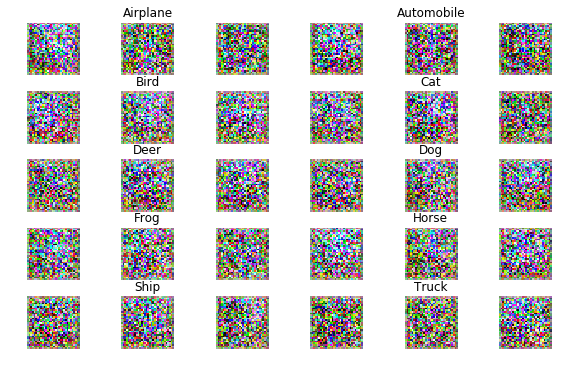

	Epoch: 2, Generator Loss: 0.105884012278, Discriminator Loss: [0.00703637 0.00233075]
	Epoch: 3, Generator Loss: 0.0806842213556, Discriminator Loss: [0.00462716 0.00286092]
	Epoch: 4, Generator Loss: 0.0837046654368, Discriminator Loss: [0.00649819 0.00294094]
	Epoch: 5, Generator Loss: 0.0834797687933, Discriminator Loss: [0.00318889 0.00307098]
	Epoch: 6, Generator Loss: 0.0926893105428, Discriminator Loss: [0.00620664 0.00308099]
	Epoch: 7, Generator Loss: 0.0792668167974, Discriminator Loss: [0.00730695 0.00457146]
	Epoch: 8, Generator Loss: 0.069092206552, Discriminator Loss: [0.00816983 0.00534171]
	Epoch: 9, Generator Loss: 0.0754727601394, Discriminator Loss: [0.00740854 0.00529169]
	Epoch: 10, Generator Loss: 0.0705053497979, Discriminator Loss: [0.00782166 0.00536172]
	Epoch: 11, Generator Loss: 0.0613154899448, Discriminator Loss: [0.0091219  0.00623199]
FID (different): 176.392


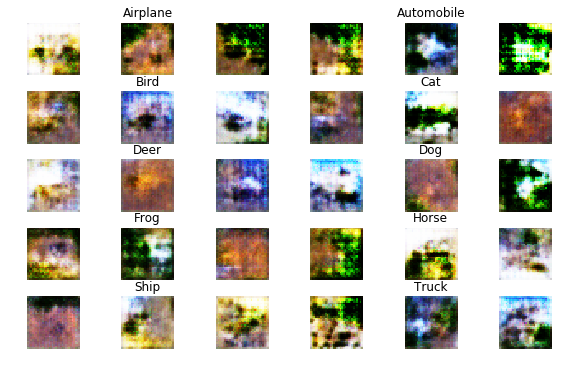

	Epoch: 12, Generator Loss: 0.0672389749681, Discriminator Loss: [0.00734995 0.00615197]
	Epoch: 13, Generator Loss: 0.0669732296818, Discriminator Loss: [0.00908367 0.00601192]
	Epoch: 14, Generator Loss: 0.068234113206, Discriminator Loss: [0.00756322 0.00580186]
	Epoch: 15, Generator Loss: 0.0611681255885, Discriminator Loss: [0.01048255 0.00640205]
	Epoch: 16, Generator Loss: 0.0590417781957, Discriminator Loss: [0.00952537 0.00672215]
	Epoch: 17, Generator Loss: 0.0611221874264, Discriminator Loss: [0.0082524  0.00636204]
	Epoch: 18, Generator Loss: 0.0620090239485, Discriminator Loss: [0.0079985  0.00605194]
	Epoch: 19, Generator Loss: 0.0636718770759, Discriminator Loss: [0.00710952 0.00598191]
	Epoch: 20, Generator Loss: 0.0666059736406, Discriminator Loss: [0.00700237 0.00559179]
	Epoch: 21, Generator Loss: 0.0641805101448, Discriminator Loss: [0.00678808 0.00611196]
FID (different): 148.719


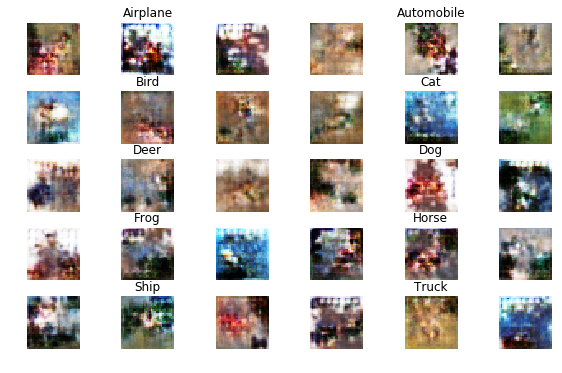

	Epoch: 22, Generator Loss: 0.0659637425224, Discriminator Loss: [0.00727705 0.00602193]
	Epoch: 23, Generator Loss: 0.0616031627191, Discriminator Loss: [0.0065786  0.00620198]
	Epoch: 24, Generator Loss: 0.0625488674137, Discriminator Loss: [0.00762858 0.00629201]
	Epoch: 25, Generator Loss: 0.0624746963401, Discriminator Loss: [0.00642619 0.00652209]
	Epoch: 26, Generator Loss: 0.0615554344334, Discriminator Loss: [0.00677182 0.00588188]
	Epoch: 27, Generator Loss: 0.0620184631567, Discriminator Loss: [0.00618203 0.00553177]
	Epoch: 28, Generator Loss: 0.063442388051, Discriminator Loss: [0.00607834 0.00578185]
	Epoch: 29, Generator Loss: 0.061116167281, Discriminator Loss: [0.00608063 0.00620198]
	Epoch: 30, Generator Loss: 0.0652946497811, Discriminator Loss: [0.00617731 0.00581186]
	Epoch: 31, Generator Loss: 0.0619553904527, Discriminator Loss: [0.00518858 0.00587188]
FID (different): 139.510


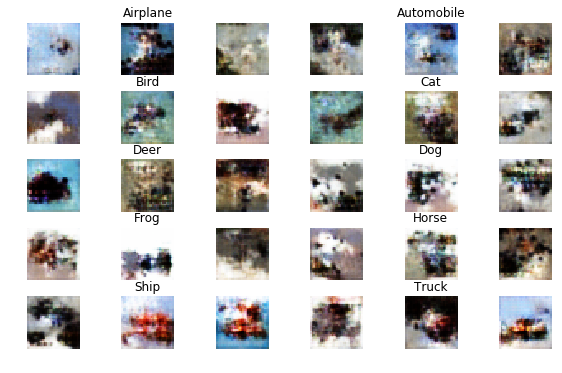

	Epoch: 32, Generator Loss: 0.0600933558504, Discriminator Loss: [0.00555808 0.00572183]
	Epoch: 33, Generator Loss: 0.0606832086048, Discriminator Loss: [0.00508318 0.00556178]
	Epoch: 34, Generator Loss: 0.064835666847, Discriminator Loss: [0.00507707 0.00537172]
	Epoch: 35, Generator Loss: 0.0650601910568, Discriminator Loss: [0.00520464 0.00560179]
	Epoch: 36, Generator Loss: 0.0644001441789, Discriminator Loss: [0.00538934 0.00529169]
	Epoch: 37, Generator Loss: 0.0626473716829, Discriminator Loss: [0.00448577 0.0053217 ]
	Epoch: 38, Generator Loss: 0.0636353610267, Discriminator Loss: [0.00411132 0.00527169]
	Epoch: 39, Generator Loss: 0.0628579009358, Discriminator Loss: [0.0040804 0.0043814]
	Epoch: 40, Generator Loss: 0.0632319810601, Discriminator Loss: [0.00413693 0.00483155]
	Epoch: 41, Generator Loss: 0.062240872432, Discriminator Loss: [0.00370772 0.00491157]
FID (different): 140.470


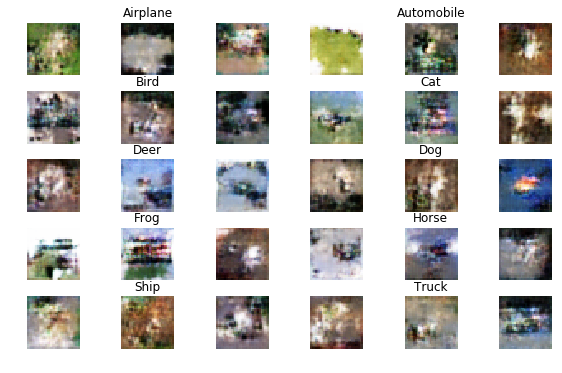

	Epoch: 42, Generator Loss: 0.0636587678699, Discriminator Loss: [0.0043964  0.00492158]
	Epoch: 43, Generator Loss: 0.0621106210958, Discriminator Loss: [0.00384271 0.00477153]
	Epoch: 44, Generator Loss: 0.0641115838221, Discriminator Loss: [0.00346474 0.0049916 ]
	Epoch: 45, Generator Loss: 0.0636663152985, Discriminator Loss: [0.00406978 0.00503161]
	Epoch: 46, Generator Loss: 0.0606057662207, Discriminator Loss: [0.0036783  0.00487156]
	Epoch: 47, Generator Loss: 0.0617220958888, Discriminator Loss: [0.00398104 0.00466149]
	Epoch: 48, Generator Loss: 0.0596493225397, Discriminator Loss: [0.00351351 0.00462148]
	Epoch: 49, Generator Loss: 0.0618845421282, Discriminator Loss: [0.00352058 0.00466149]
	Epoch: 50, Generator Loss: 0.0617880250367, Discriminator Loss: [0.00370385 0.00453145]
	Epoch: 51, Generator Loss: 0.0612640791452, Discriminator Loss: [0.00394773 0.00451144]
FID (different): 139.412


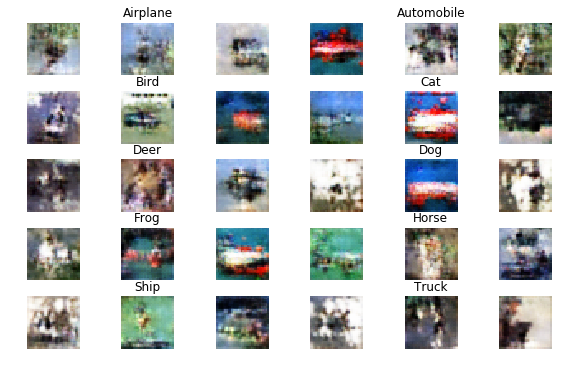

	Epoch: 52, Generator Loss: 0.0601333442327, Discriminator Loss: [0.00357031 0.00466149]
	Epoch: 53, Generator Loss: 0.0623289566492, Discriminator Loss: [0.00339993 0.00471151]
	Epoch: 54, Generator Loss: 0.0618134509586, Discriminator Loss: [0.0034652 0.0043814]
	Epoch: 55, Generator Loss: 0.0635118736348, Discriminator Loss: [0.00342846 0.00485155]
	Epoch: 56, Generator Loss: 0.06161060666, Discriminator Loss: [0.00314279 0.0040713 ]
	Epoch: 57, Generator Loss: 0.0623383257972, Discriminator Loss: [0.00346672 0.00378121]
	Epoch: 58, Generator Loss: 0.0593373836537, Discriminator Loss: [0.00324204 0.00421135]
	Epoch: 59, Generator Loss: 0.0608829717783, Discriminator Loss: [0.00309299 0.00423135]
	Epoch: 60, Generator Loss: 0.0627856552219, Discriminator Loss: [0.00341014 0.00423135]
	Epoch: 61, Generator Loss: 0.0615132038175, Discriminator Loss: [0.0033781  0.00455146]
FID (different): 145.067


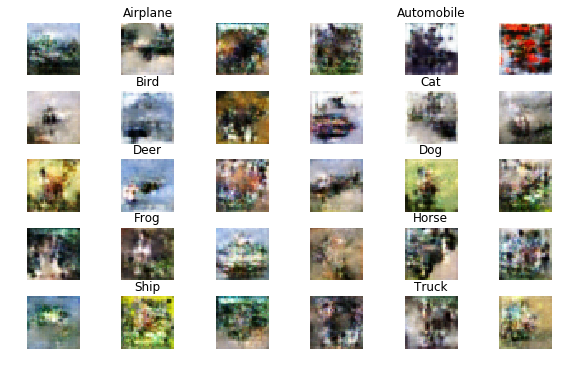

	Epoch: 62, Generator Loss: 0.0626507332017, Discriminator Loss: [0.00286382 0.00400128]
	Epoch: 63, Generator Loss: 0.0609017157219, Discriminator Loss: [0.00306724 0.00401128]
	Epoch: 64, Generator Loss: 0.0612938219393, Discriminator Loss: [0.00305703 0.00441141]
	Epoch: 65, Generator Loss: 0.0610305278463, Discriminator Loss: [0.00309676 0.00403129]
	Epoch: 66, Generator Loss: 0.0592434508547, Discriminator Loss: [0.0027965  0.00384123]
	Epoch: 67, Generator Loss: 0.0594145981511, Discriminator Loss: [0.00294942 0.00404129]
	Epoch: 68, Generator Loss: 0.0621861381201, Discriminator Loss: [0.00274864 0.00396127]
	Epoch: 69, Generator Loss: 0.0610019278435, Discriminator Loss: [0.00323528 0.0040613 ]
	Epoch: 70, Generator Loss: 0.0609771486434, Discriminator Loss: [0.00309991 0.00394126]
	Epoch: 71, Generator Loss: 0.0581890336988, Discriminator Loss: [0.00286783 0.00422135]
FID (different): 148.049


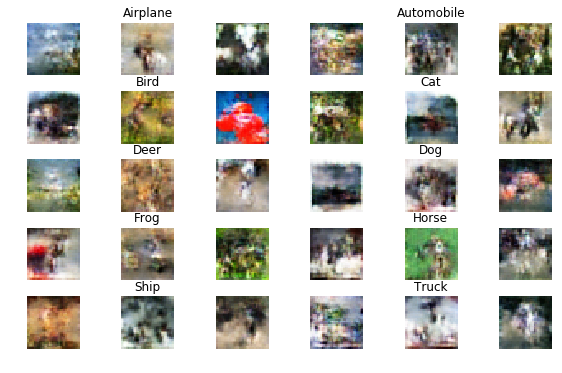

	Epoch: 72, Generator Loss: 0.0590657748272, Discriminator Loss: [0.00293203 0.0040713 ]
	Epoch: 73, Generator Loss: 0.0600249123176, Discriminator Loss: [0.00255065 0.00340109]
	Epoch: 74, Generator Loss: 0.0606578907496, Discriminator Loss: [0.00284391 0.00384123]
	Epoch: 75, Generator Loss: 0.0585850402427, Discriminator Loss: [0.00278443 0.00393126]
	Epoch: 76, Generator Loss: 0.0593516467933, Discriminator Loss: [0.00310748 0.00443142]
	Epoch: 77, Generator Loss: 0.0617728895781, Discriminator Loss: [0.00287797 0.00364117]
	Epoch: 78, Generator Loss: 0.0623919597509, Discriminator Loss: [0.00286715 0.00381122]
	Epoch: 79, Generator Loss: 0.0613255019988, Discriminator Loss: [0.00316725 0.00355114]
	Epoch: 80, Generator Loss: 0.060553770975, Discriminator Loss: [0.0029753  0.00368118]
	Epoch: 81, Generator Loss: 0.0601498642591, Discriminator Loss: [0.00286841 0.00395126]
FID (different): 151.300


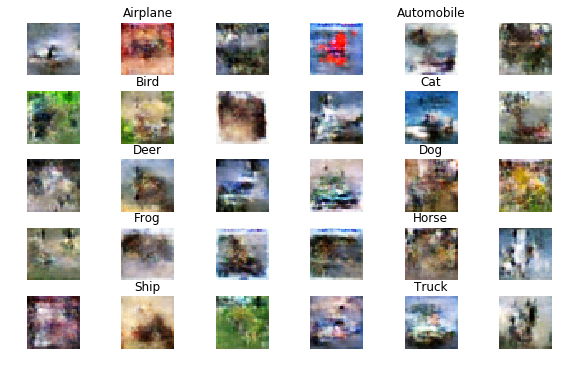

	Epoch: 82, Generator Loss: 0.0594487185667, Discriminator Loss: [0.00269017 0.00370118]
	Epoch: 83, Generator Loss: 0.0606734010841, Discriminator Loss: [0.00268495 0.00364117]
	Epoch: 84, Generator Loss: 0.0610467050506, Discriminator Loss: [0.00253135 0.00354113]
	Epoch: 85, Generator Loss: 0.0599348809136, Discriminator Loss: [0.00276751 0.00366117]
	Epoch: 86, Generator Loss: 0.0598766877007, Discriminator Loss: [0.00256132 0.00384123]
	Epoch: 87, Generator Loss: 0.0609792925789, Discriminator Loss: [0.00285028 0.00389125]
	Epoch: 88, Generator Loss: 0.0597637381963, Discriminator Loss: [0.00247849 0.00321103]
	Epoch: 89, Generator Loss: 0.0605561803459, Discriminator Loss: [0.00267048 0.00302097]
	Epoch: 90, Generator Loss: 0.0567944008623, Discriminator Loss: [0.00270072 0.0037412 ]
	Epoch: 91, Generator Loss: 0.0560033915138, Discriminator Loss: [0.0025371  0.00413132]
FID (different): 150.983


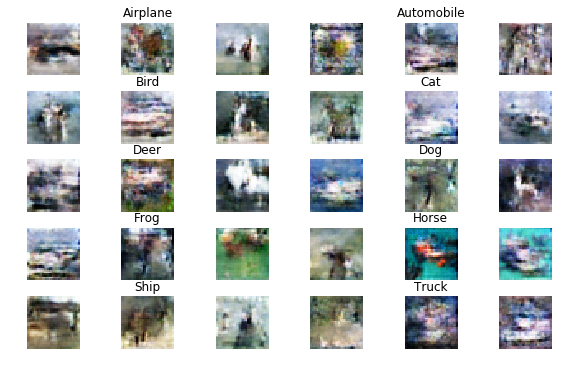

	Epoch: 92, Generator Loss: 0.0571217863569, Discriminator Loss: [0.00233178 0.00367117]
	Epoch: 93, Generator Loss: 0.0581307873683, Discriminator Loss: [0.00248663 0.00390125]
	Epoch: 94, Generator Loss: 0.0588696335708, Discriminator Loss: [0.0027877  0.00386124]
	Epoch: 95, Generator Loss: 0.0583599372344, Discriminator Loss: [0.00261701 0.00365117]
	Epoch: 96, Generator Loss: 0.0568598139454, Discriminator Loss: [0.00268043 0.00372119]
	Epoch: 97, Generator Loss: 0.058247728476, Discriminator Loss: [0.00252988 0.00379121]
	Epoch: 98, Generator Loss: 0.0590403458526, Discriminator Loss: [0.00268559 0.00390125]
	Epoch: 99, Generator Loss: 0.0576994666369, Discriminator Loss: [0.00266137 0.00351112]
	Epoch: 100, Generator Loss: 0.0597096959394, Discriminator Loss: [0.0026153  0.00362116]
	Epoch: 101, Generator Loss: 0.0566705219572, Discriminator Loss: [0.00254093 0.00395126]
FID (different): 142.105


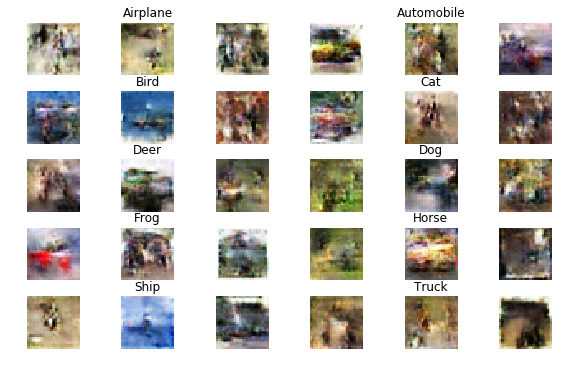

	Epoch: 102, Generator Loss: 0.0555248069702, Discriminator Loss: [0.00261081 0.00403129]
	Epoch: 103, Generator Loss: 0.058688796284, Discriminator Loss: [0.0025537  0.00394126]
	Epoch: 104, Generator Loss: 0.0574335351338, Discriminator Loss: [0.00257701 0.00425136]
	Epoch: 105, Generator Loss: 0.058074234695, Discriminator Loss: [0.00252828 0.00394126]
	Epoch: 106, Generator Loss: 0.0570361670703, Discriminator Loss: [0.00260108 0.00378121]
	Epoch: 107, Generator Loss: 0.0586336066567, Discriminator Loss: [0.00247057 0.00358115]
	Epoch: 108, Generator Loss: 0.0580264369596, Discriminator Loss: [0.00257308 0.00340109]
	Epoch: 109, Generator Loss: 0.0572129323144, Discriminator Loss: [0.00251244 0.00358115]
	Epoch: 110, Generator Loss: 0.0558088639329, Discriminator Loss: [0.00230676 0.00379121]
	Epoch: 111, Generator Loss: 0.055549881675, Discriminator Loss: [0.0024148  0.00379121]
FID (different): 148.757


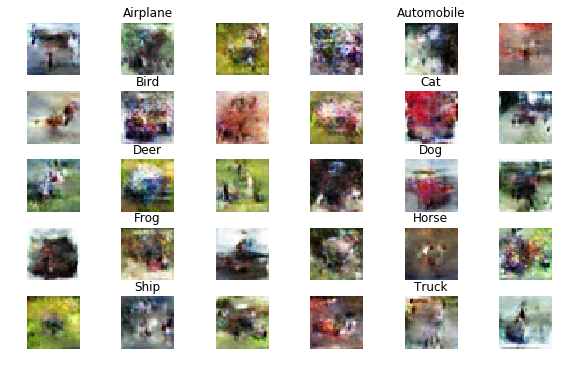

	Epoch: 112, Generator Loss: 0.0555463348552, Discriminator Loss: [0.00258001 0.00398127]
	Epoch: 113, Generator Loss: 0.0575526958849, Discriminator Loss: [0.00248298 0.00382122]
	Epoch: 114, Generator Loss: 0.0563146188836, Discriminator Loss: [0.00241372 0.00381122]
	Epoch: 115, Generator Loss: 0.0576805291499, Discriminator Loss: [0.00247864 0.00366117]
	Epoch: 116, Generator Loss: 0.0561794511182, Discriminator Loss: [0.00238433 0.00361116]
	Epoch: 117, Generator Loss: 0.0561550826636, Discriminator Loss: [0.0024591  0.00386124]
	Epoch: 118, Generator Loss: 0.0558841152167, Discriminator Loss: [0.00223483 0.0040713 ]
	Epoch: 119, Generator Loss: 0.0558197196101, Discriminator Loss: [0.00246105 0.00356114]
	Epoch: 120, Generator Loss: 0.0553623798104, Discriminator Loss: [0.00240333 0.00372119]
	Epoch: 121, Generator Loss: 0.05599059735, Discriminator Loss: [0.00250812 0.0037612 ]
FID (different): 140.274


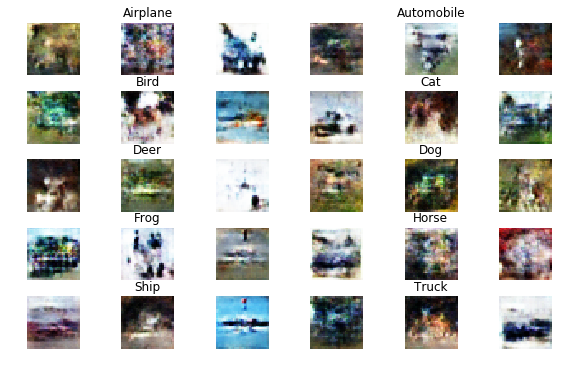

	Epoch: 122, Generator Loss: 0.0553698301621, Discriminator Loss: [0.00211791 0.00364117]
	Epoch: 123, Generator Loss: 0.0554041712904, Discriminator Loss: [0.00224458 0.00360115]
	Epoch: 124, Generator Loss: 0.055500210171, Discriminator Loss: [0.00224245 0.00354113]
	Epoch: 125, Generator Loss: 0.0559750047444, Discriminator Loss: [0.00242909 0.00373119]
	Epoch: 126, Generator Loss: 0.0557612002125, Discriminator Loss: [0.00237624 0.00369118]
	Epoch: 127, Generator Loss: 0.0549673861639, Discriminator Loss: [0.00235621 0.00396127]
	Epoch: 128, Generator Loss: 0.0539689572306, Discriminator Loss: [0.00253611 0.00421135]
	Epoch: 129, Generator Loss: 0.0550225351898, Discriminator Loss: [0.00224531 0.00394126]
	Epoch: 130, Generator Loss: 0.0545185595255, Discriminator Loss: [0.00223105 0.00389125]
	Epoch: 131, Generator Loss: 0.0542271526461, Discriminator Loss: [0.00228778 0.00391125]
FID (different): 144.682


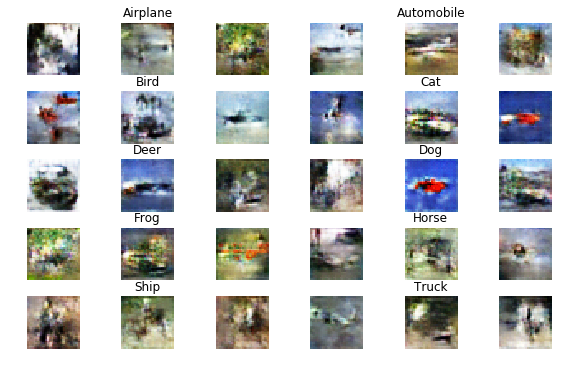

	Epoch: 132, Generator Loss: 0.0545706004095, Discriminator Loss: [0.00215669 0.00398127]
	Epoch: 133, Generator Loss: 0.0533664612703, Discriminator Loss: [0.00221424 0.00430138]
	Epoch: 134, Generator Loss: 0.0540403776376, Discriminator Loss: [0.00240388 0.00371119]
	Epoch: 135, Generator Loss: 0.0526984923933, Discriminator Loss: [0.00208392 0.00418134]
	Epoch: 136, Generator Loss: 0.0537736077009, Discriminator Loss: [0.00225514 0.00380122]
	Epoch: 137, Generator Loss: 0.0515815492781, Discriminator Loss: [0.00218037 0.00432138]
	Epoch: 138, Generator Loss: 0.0534341294085, Discriminator Loss: [0.00235521 0.00472151]
	Epoch: 139, Generator Loss: 0.0523083793064, Discriminator Loss: [0.0021773  0.00466149]
	Epoch: 140, Generator Loss: 0.0514916932537, Discriminator Loss: [0.00235303 0.00451144]
	Epoch: 141, Generator Loss: 0.0515577941179, Discriminator Loss: [0.00216518 0.00482154]
FID (different): 142.818


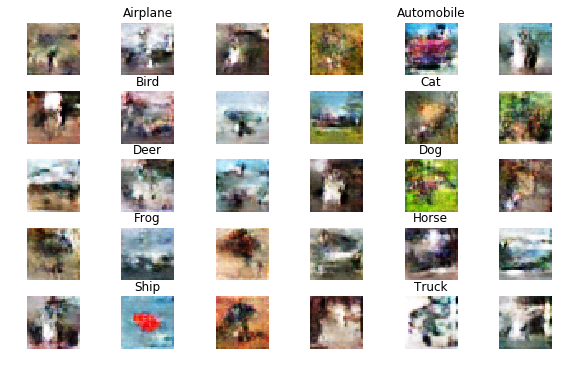

	Epoch: 142, Generator Loss: 0.0538293851322, Discriminator Loss: [0.00210728 0.00461148]
	Epoch: 143, Generator Loss: 0.0537295898616, Discriminator Loss: [0.00213353 0.00403129]
	Epoch: 144, Generator Loss: 0.0556124343457, Discriminator Loss: [0.00226935 0.00423135]
	Epoch: 145, Generator Loss: 0.0555654903075, Discriminator Loss: [0.00242673 0.00380122]
	Epoch: 146, Generator Loss: 0.0547381631849, Discriminator Loss: [0.0021824  0.00388124]
	Epoch: 147, Generator Loss: 0.0541452776913, Discriminator Loss: [0.00222529 0.00432138]
	Epoch: 148, Generator Loss: 0.0544644302656, Discriminator Loss: [0.00217029 0.00401128]
	Epoch: 149, Generator Loss: 0.0523213059588, Discriminator Loss: [0.00215939 0.00441141]
	Epoch: 150, Generator Loss: 0.0539491878734, Discriminator Loss: [0.00220324 0.00382122]
	Epoch: 151, Generator Loss: 0.0528832629762, Discriminator Loss: [0.00238747 0.00419134]
FID (different): 154.980


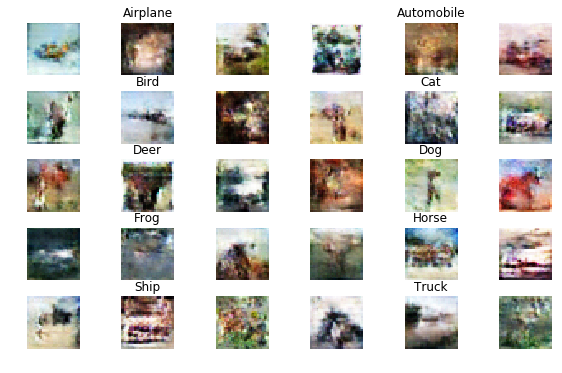

	Epoch: 152, Generator Loss: 0.0549966606685, Discriminator Loss: [0.00228917 0.00379121]
	Epoch: 153, Generator Loss: 0.05487863584, Discriminator Loss: [0.00221558 0.0037512 ]
	Epoch: 154, Generator Loss: 0.0534394970319, Discriminator Loss: [0.00221738 0.00453145]
	Epoch: 155, Generator Loss: 0.0527540416327, Discriminator Loss: [0.00227061 0.00451144]
	Epoch: 156, Generator Loss: 0.0530232972586, Discriminator Loss: [0.00215002 0.00421135]
	Epoch: 157, Generator Loss: 0.0530504632393, Discriminator Loss: [0.00219614 0.00417133]
	Epoch: 158, Generator Loss: 0.0544150277075, Discriminator Loss: [0.00228589 0.00427137]
	Epoch: 159, Generator Loss: 0.0528598324743, Discriminator Loss: [0.0022735  0.00382122]
	Epoch: 160, Generator Loss: 0.0526618098175, Discriminator Loss: [0.00207834 0.00400128]
	Epoch: 161, Generator Loss: 0.0538520126123, Discriminator Loss: [0.00211125 0.00424136]
FID (different): 159.955


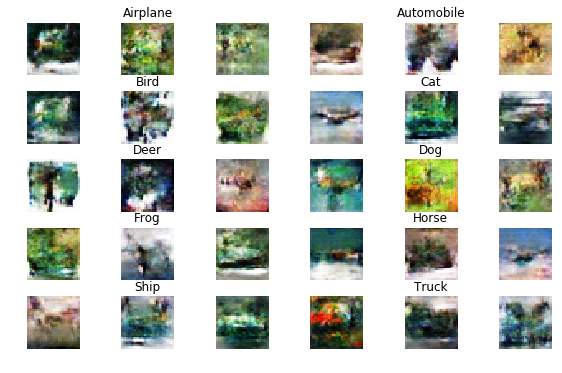

	Epoch: 162, Generator Loss: 0.0530358781888, Discriminator Loss: [0.00199885 0.0043814 ]
	Epoch: 163, Generator Loss: 0.051988873378, Discriminator Loss: [0.00222878 0.00478153]
	Epoch: 164, Generator Loss: 0.0537013160434, Discriminator Loss: [0.00214246 0.00428137]
	Epoch: 165, Generator Loss: 0.0533838507155, Discriminator Loss: [0.00220246 0.00418134]
	Epoch: 166, Generator Loss: 0.0534844838092, Discriminator Loss: [0.0022666  0.00445142]
	Epoch: 167, Generator Loss: 0.0522243834641, Discriminator Loss: [0.00233519 0.00435139]
	Epoch: 168, Generator Loss: 0.0527637589451, Discriminator Loss: [0.00208926 0.00412132]
	Epoch: 169, Generator Loss: 0.0538833489339, Discriminator Loss: [0.00218243 0.00394126]
	Epoch: 170, Generator Loss: 0.0527188753502, Discriminator Loss: [0.00210947 0.00454145]
	Epoch: 171, Generator Loss: 0.0533606123833, Discriminator Loss: [0.00218259 0.0034311 ]
FID (different): 152.562


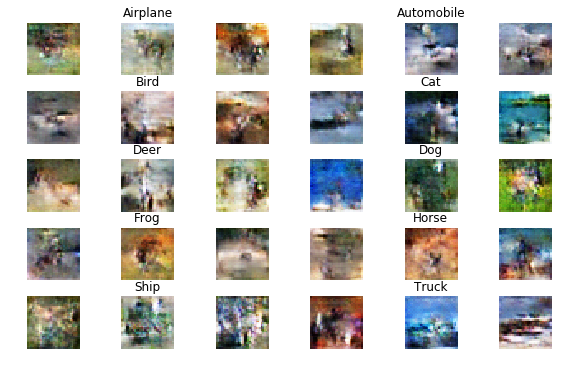

	Epoch: 172, Generator Loss: 0.0533175732506, Discriminator Loss: [0.00213863 0.00432138]
	Epoch: 173, Generator Loss: 0.0529291899958, Discriminator Loss: [0.00231508 0.00412132]
	Epoch: 174, Generator Loss: 0.0521392762737, Discriminator Loss: [0.00199244 0.00418134]
	Epoch: 175, Generator Loss: 0.0531166852971, Discriminator Loss: [0.00221577 0.00441141]
	Epoch: 176, Generator Loss: 0.0558564566772, Discriminator Loss: [0.00197897 0.00400128]
	Epoch: 177, Generator Loss: 0.0544760477528, Discriminator Loss: [0.0022968  0.00342109]
	Epoch: 178, Generator Loss: 0.0516016332197, Discriminator Loss: [0.00208494 0.00467149]
	Epoch: 179, Generator Loss: 0.0528611718616, Discriminator Loss: [0.0021304  0.00451144]
	Epoch: 180, Generator Loss: 0.0524730341993, Discriminator Loss: [0.00198035 0.00441141]
	Epoch: 181, Generator Loss: 0.0518513502751, Discriminator Loss: [0.00201075 0.00442141]
FID (different): 157.642


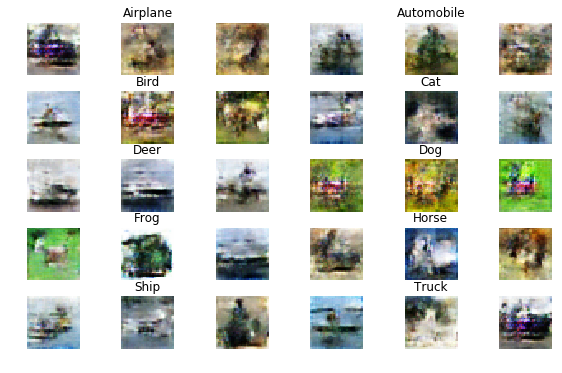

	Epoch: 182, Generator Loss: 0.0518690028661, Discriminator Loss: [0.00194599 0.00448143]
	Epoch: 183, Generator Loss: 0.0532600208068, Discriminator Loss: [0.0019635  0.00403129]
	Epoch: 184, Generator Loss: 0.0543417373479, Discriminator Loss: [0.00207685 0.00382122]
	Epoch: 185, Generator Loss: 0.053126445653, Discriminator Loss: [0.00188253 0.00417133]
	Epoch: 186, Generator Loss: 0.0534526911038, Discriminator Loss: [0.00213232 0.00421135]
	Epoch: 187, Generator Loss: 0.0506818616589, Discriminator Loss: [0.0020798 0.0053017]
	Epoch: 188, Generator Loss: 0.0515777843405, Discriminator Loss: [0.00200459 0.00449144]
	Epoch: 189, Generator Loss: 0.0517961459947, Discriminator Loss: [0.00211694 0.0043714 ]
	Epoch: 190, Generator Loss: 0.0524951431724, Discriminator Loss: [0.00188677 0.00451144]
	Epoch: 191, Generator Loss: 0.0515726314769, Discriminator Loss: [0.00216678 0.00475152]
FID (different): 168.324


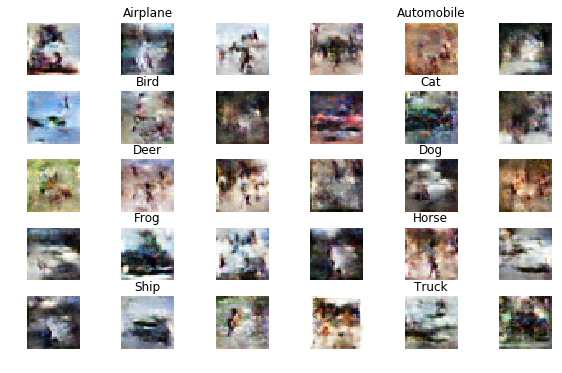

	Epoch: 192, Generator Loss: 0.0510812396429, Discriminator Loss: [0.00203953 0.00507162]
	Epoch: 193, Generator Loss: 0.0506482588344, Discriminator Loss: [0.00200188 0.00462148]
	Epoch: 194, Generator Loss: 0.0518107514986, Discriminator Loss: [0.00193093 0.00410131]
	Epoch: 195, Generator Loss: 0.0516552077976, Discriminator Loss: [0.0019326  0.00456146]
	Epoch: 196, Generator Loss: 0.0525607578886, Discriminator Loss: [0.00204198 0.00461148]
	Epoch: 197, Generator Loss: 0.052217491305, Discriminator Loss: [0.00201397 0.0043614 ]
	Epoch: 198, Generator Loss: 0.0523016703114, Discriminator Loss: [0.00203863 0.00441141]
	Epoch: 199, Generator Loss: 0.0514261339446, Discriminator Loss: [0.0019483  0.00487156]
	Epoch: 200, Generator Loss: 0.05084760012, Discriminator Loss: [0.00207085 0.00527169]
	Epoch: 201, Generator Loss: 0.0523853254685, Discriminator Loss: [0.00206593 0.00455146]
FID (different): 148.191


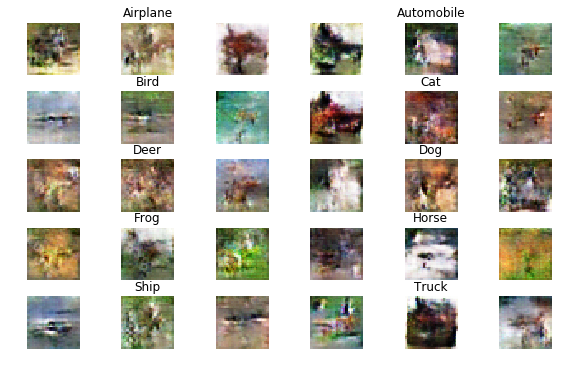

	Epoch: 202, Generator Loss: 0.0522245805181, Discriminator Loss: [0.00186404 0.0043814 ]
	Epoch: 203, Generator Loss: 0.0520222518264, Discriminator Loss: [0.00190579 0.00467149]
	Epoch: 204, Generator Loss: 0.0538035884557, Discriminator Loss: [0.00197175 0.00423135]
	Epoch: 205, Generator Loss: 0.0531300658911, Discriminator Loss: [0.00216634 0.00419134]
	Epoch: 206, Generator Loss: 0.0511191166012, Discriminator Loss: [0.00215721 0.00422135]
	Epoch: 207, Generator Loss: 0.0511687241504, Discriminator Loss: [0.00195068 0.00463148]
	Epoch: 208, Generator Loss: 0.0512968501727, Discriminator Loss: [0.00189317 0.00479153]
	Epoch: 209, Generator Loss: 0.0503484960097, Discriminator Loss: [0.00207902 0.00518166]
	Epoch: 210, Generator Loss: 0.0516714329298, Discriminator Loss: [0.00202897 0.00448143]
	Epoch: 211, Generator Loss: 0.0503218726526, Discriminator Loss: [0.00183227 0.00513164]
FID (different): 142.355


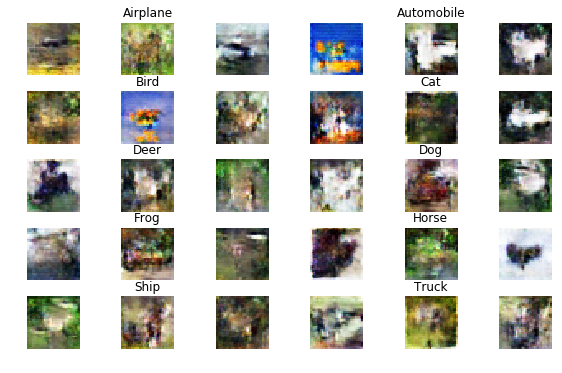

	Epoch: 212, Generator Loss: 0.0510795099635, Discriminator Loss: [0.00184721 0.00474152]
	Epoch: 213, Generator Loss: 0.0526082466873, Discriminator Loss: [0.00182838 0.00464149]
	Epoch: 214, Generator Loss: 0.0522227304083, Discriminator Loss: [0.00190751 0.0040713 ]
	Epoch: 215, Generator Loss: 0.053007349162, Discriminator Loss: [0.00196388 0.00394126]
	Epoch: 216, Generator Loss: 0.052341008919, Discriminator Loss: [0.00189588 0.00414133]
	Epoch: 217, Generator Loss: 0.0509685096301, Discriminator Loss: [0.00201682 0.00448143]
	Epoch: 218, Generator Loss: 0.05378690175, Discriminator Loss: [0.00189212 0.0037612 ]
	Epoch: 219, Generator Loss: 0.053756397146, Discriminator Loss: [0.00199629 0.00379121]
	Epoch: 220, Generator Loss: 0.0512911452221, Discriminator Loss: [0.00187717 0.00431138]
	Epoch: 221, Generator Loss: 0.0499813355191, Discriminator Loss: [0.00188189 0.00486156]
FID (different): 165.941


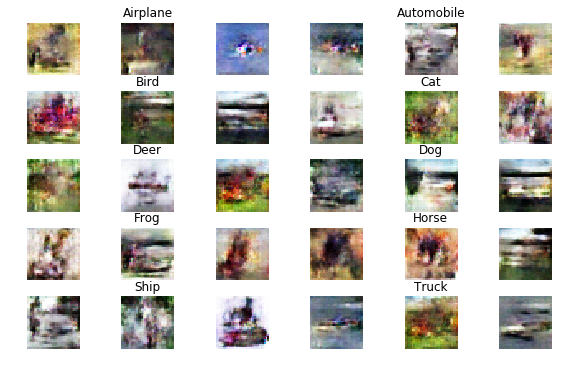

	Epoch: 222, Generator Loss: 0.0504111755215, Discriminator Loss: [0.00185144 0.00498159]
	Epoch: 223, Generator Loss: 0.0509890981887, Discriminator Loss: [0.00205587 0.00514165]
	Epoch: 224, Generator Loss: 0.0483657428458, Discriminator Loss: [0.00188054 0.00602193]
	Epoch: 225, Generator Loss: 0.0493551320212, Discriminator Loss: [0.00189017 0.00554177]
	Epoch: 226, Generator Loss: 0.0507311657663, Discriminator Loss: [0.00189119 0.00516165]
	Epoch: 227, Generator Loss: 0.0494405080048, Discriminator Loss: [0.00189668 0.00590189]
	Epoch: 228, Generator Loss: 0.0485535014454, Discriminator Loss: [0.00189709 0.00659211]
	Epoch: 229, Generator Loss: 0.0499028344466, Discriminator Loss: [0.00180875 0.00523167]
	Epoch: 230, Generator Loss: 0.0509948959424, Discriminator Loss: [0.00198364 0.00491157]
	Epoch: 231, Generator Loss: 0.0498382243854, Discriminator Loss: [0.00175501 0.00590189]
FID (different): 156.832


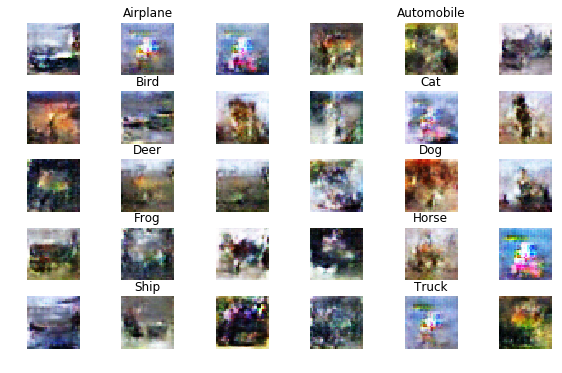

	Epoch: 232, Generator Loss: 0.0499020851528, Discriminator Loss: [0.00184478 0.00523167]
	Epoch: 233, Generator Loss: 0.0506461725955, Discriminator Loss: [0.00189594 0.00560179]
	Epoch: 234, Generator Loss: 0.0509661578033, Discriminator Loss: [0.00194903 0.0046915 ]
	Epoch: 235, Generator Loss: 0.0491694236382, Discriminator Loss: [0.00196109 0.00591189]
	Epoch: 236, Generator Loss: 0.0488595590091, Discriminator Loss: [0.00174085 0.00588188]
	Epoch: 237, Generator Loss: 0.0510808267606, Discriminator Loss: [0.00183343 0.00447143]
	Epoch: 238, Generator Loss: 0.0505773435024, Discriminator Loss: [0.00185785 0.00514165]
	Epoch: 239, Generator Loss: 0.0518751625215, Discriminator Loss: [0.00188505 0.00503161]
	Epoch: 240, Generator Loss: 0.0539271619347, Discriminator Loss: [0.00188021 0.00403129]
	Epoch: 241, Generator Loss: 0.0520696375953, Discriminator Loss: [0.00167313 0.00517165]
FID (different): 171.146


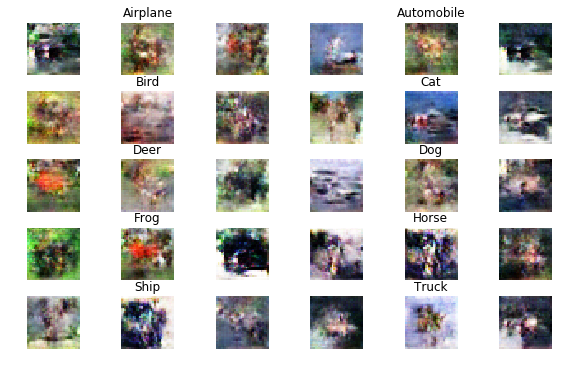

	Epoch: 242, Generator Loss: 0.0509394692703, Discriminator Loss: [0.00188868 0.00521167]
	Epoch: 243, Generator Loss: 0.0504324082071, Discriminator Loss: [0.00187242 0.0056218 ]
	Epoch: 244, Generator Loss: 0.0503517807522, Discriminator Loss: [0.0017385  0.00521167]
	Epoch: 245, Generator Loss: 0.0490213695165, Discriminator Loss: [0.00185874 0.0059319 ]
	Epoch: 246, Generator Loss: 0.0512528714084, Discriminator Loss: [0.00187383 0.0053217 ]
	Epoch: 247, Generator Loss: 0.0520291096422, Discriminator Loss: [0.00182074 0.00483155]
	Epoch: 248, Generator Loss: 0.0526325678245, Discriminator Loss: [0.00190829 0.00425136]
	Epoch: 249, Generator Loss: 0.0499375162601, Discriminator Loss: [0.00173405 0.00506162]
	Epoch: 250, Generator Loss: 0.0506282835703, Discriminator Loss: [0.00188163 0.00528169]
	Epoch: 251, Generator Loss: 0.0506326894296, Discriminator Loss: [0.00172277 0.00480154]
FID (different): 162.420


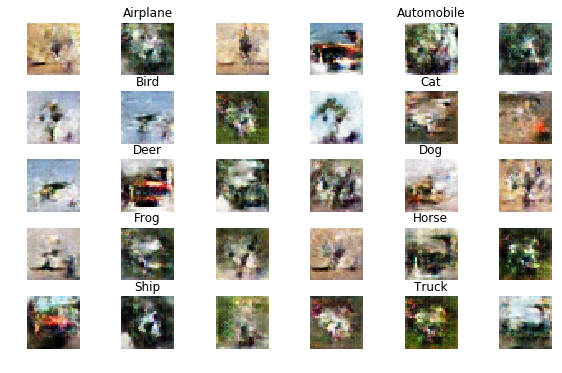

	Epoch: 252, Generator Loss: 0.0488101915574, Discriminator Loss: [0.00191572 0.00615197]
	Epoch: 253, Generator Loss: 0.0487375320454, Discriminator Loss: [0.00181863 0.00675216]
	Epoch: 254, Generator Loss: 0.0509102956586, Discriminator Loss: [0.00168925 0.00591189]
	Epoch: 255, Generator Loss: 0.0510370525294, Discriminator Loss: [0.00172478 0.00543174]
	Epoch: 256, Generator Loss: 0.0537041306648, Discriminator Loss: [0.00194315 0.00419134]
	Epoch: 257, Generator Loss: 0.0507088772924, Discriminator Loss: [0.00175677 0.00526168]
	Epoch: 258, Generator Loss: 0.0540553117684, Discriminator Loss: [0.00182505 0.00383123]
	Epoch: 259, Generator Loss: 0.052220045986, Discriminator Loss: [0.00185633 0.0046915 ]
	Epoch: 260, Generator Loss: 0.0519544992801, Discriminator Loss: [0.00184501 0.0043814 ]
	Epoch: 261, Generator Loss: 0.0510417948001, Discriminator Loss: [0.0017037  0.00506162]
FID (different): 183.747


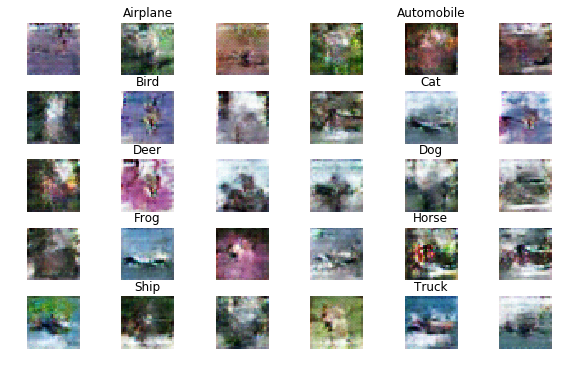

	Epoch: 262, Generator Loss: 0.0526256394905, Discriminator Loss: [0.00195789 0.00473151]
	Epoch: 263, Generator Loss: 0.0517164047488, Discriminator Loss: [0.00184497 0.00495158]
	Epoch: 264, Generator Loss: 0.0531692923107, Discriminator Loss: [0.00184812 0.0043714 ]
	Epoch: 265, Generator Loss: 0.0514674061544, Discriminator Loss: [0.00170612 0.00467149]
	Epoch: 266, Generator Loss: 0.0515113163849, Discriminator Loss: [0.0018098  0.00472151]
	Epoch: 267, Generator Loss: 0.0493704739972, Discriminator Loss: [0.00181801 0.00526168]
	Epoch: 268, Generator Loss: 0.0530203429746, Discriminator Loss: [0.00173493 0.00431138]
	Epoch: 269, Generator Loss: 0.051689886711, Discriminator Loss: [0.00186723 0.00454145]
	Epoch: 270, Generator Loss: 0.0518114171474, Discriminator Loss: [0.00182881 0.00463148]
	Epoch: 271, Generator Loss: 0.0529950957903, Discriminator Loss: [0.0016537  0.00447143]
FID (different): 194.192


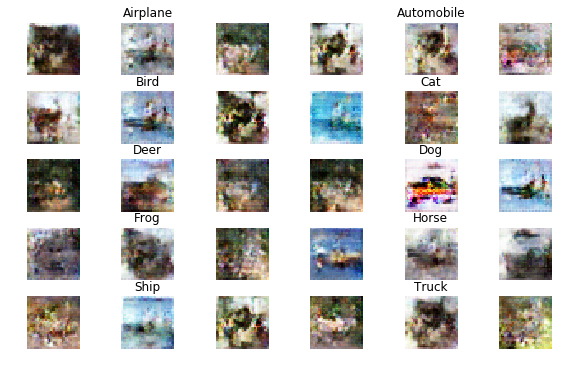

	Epoch: 272, Generator Loss: 0.0520759417977, Discriminator Loss: [0.00182312 0.00509163]
	Epoch: 273, Generator Loss: 0.0534330583565, Discriminator Loss: [0.00180985 0.00463148]
	Epoch: 274, Generator Loss: 0.0547671470691, Discriminator Loss: [0.00193212 0.0040613 ]
	Epoch: 275, Generator Loss: 0.0570132625546, Discriminator Loss: [0.00195967 0.00369118]
	Epoch: 276, Generator Loss: 0.0550763536812, Discriminator Loss: [0.0017281  0.00359115]
	Epoch: 277, Generator Loss: 0.0535119529265, Discriminator Loss: [0.00181034 0.00398127]
	Epoch: 278, Generator Loss: 0.0531543096415, Discriminator Loss: [0.00182837 0.00397127]
	Epoch: 279, Generator Loss: 0.0531397835088, Discriminator Loss: [0.00187967 0.00427137]
	Epoch: 280, Generator Loss: 0.0558850685857, Discriminator Loss: [0.00179487 0.0037412 ]
	Epoch: 281, Generator Loss: 0.0522217486488, Discriminator Loss: [0.00176649 0.00492158]
FID (different): 189.784


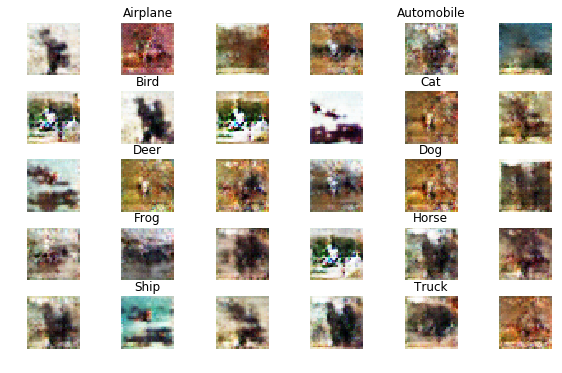

	Epoch: 282, Generator Loss: 0.0528846786819, Discriminator Loss: [0.00180214 0.00473151]
	Epoch: 283, Generator Loss: 0.053502628501, Discriminator Loss: [0.00164558 0.00325104]
	Epoch: 284, Generator Loss: 0.0510812283478, Discriminator Loss: [0.0018542  0.00494158]
	Epoch: 285, Generator Loss: 0.0527775986704, Discriminator Loss: [0.00176798 0.00414133]
	Epoch: 286, Generator Loss: 0.0532557256091, Discriminator Loss: [0.00181474 0.00475152]
	Epoch: 287, Generator Loss: 0.0525544692551, Discriminator Loss: [0.00172605 0.00491157]
	Epoch: 288, Generator Loss: 0.0515211005522, Discriminator Loss: [0.00169677 0.00450144]
	Epoch: 289, Generator Loss: 0.0506174802475, Discriminator Loss: [0.00176063 0.00557178]
	Epoch: 290, Generator Loss: 0.0489663299311, Discriminator Loss: [0.00168536 0.00605194]
	Epoch: 291, Generator Loss: 0.0468529774193, Discriminator Loss: [0.00165241 0.00734235]
FID (different): 200.058


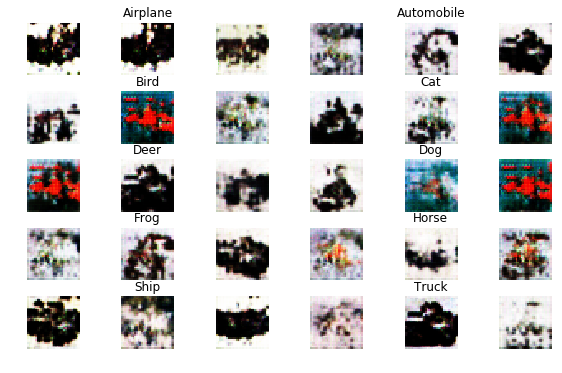

	Epoch: 292, Generator Loss: 0.048044821517, Discriminator Loss: [0.0016501  0.00652209]
	Epoch: 293, Generator Loss: 0.0493281562258, Discriminator Loss: [0.00171196 0.00568182]
	Epoch: 294, Generator Loss: 0.0491206552857, Discriminator Loss: [0.00149563 0.00645206]
	Epoch: 295, Generator Loss: 0.0510953232818, Discriminator Loss: [0.00164867 0.00484155]
	Epoch: 296, Generator Loss: 0.0499294617722, Discriminator Loss: [0.00158901 0.00549176]
	Epoch: 297, Generator Loss: 0.0510685474406, Discriminator Loss: [0.00171119 0.00494158]
	Epoch: 298, Generator Loss: 0.0497746405009, Discriminator Loss: [0.00160755 0.00572183]
	Epoch: 299, Generator Loss: 0.0473607729705, Discriminator Loss: [0.00163445 0.00723231]
	Epoch: 300, Generator Loss: 0.0484407410579, Discriminator Loss: [0.00160803 0.0065521 ]


In [15]:
epochs = 300
batch_size= 32
num_batches = int(X_train.shape[0]/batch_size)
exp_replay = []
latent_dim=100
fid_sample=[]
miminum_fid=sys.maxsize
for e in range(epochs):

  d_loss = 0.
  g_loss = 0.
  
  for batch_idx in range(len(X_train) // batch_size):
    discriminator.trainable = True
    X_batch = X_train[batch_idx*batch_size : (batch_idx+1)*batch_size]
    Y_batch = Y_train[batch_idx*batch_size : (batch_idx+1)*batch_size]

    noise = generate_noise(batch_size, 100)
    random_labels = generate_random_labels(batch_size)
    
    X_fake = generator.predict([noise, Y_batch])

    
    noise_prop = 0.05 
    
    real= -np.ones(shape=(batch_size, 1))
    flipped_idx = np.random.choice(np.arange(len(real)), size=int(noise_prop*len(real)))
    real[flipped_idx] = -1 * real[flipped_idx]
    
   
    d_real = discriminator.train_on_batch([X_batch, Y_batch], real)

   
    fake = np.ones(shape=(batch_size, 1))
    flipped_idx = np.random.choice(np.arange(len(fake)), size=int(noise_prop*len(fake)))
    fake[flipped_idx] = 1 -fake[flipped_idx]
    
    
   
    d_fake = discriminator.train_on_batch([X_fake, Y_batch], fake)
    
   
    r_idx = np.random.randint(batch_size)
    exp_replay.append([X_fake[r_idx], Y_batch[r_idx], fake[r_idx]])
    
    #If we have enough points, do experience replay
    if len(exp_replay) == batch_size:
      generated_images_rp = np.array([p[0] for p in exp_replay])
      labels_rp = np.array([p[1] for p in exp_replay])
      gene_labels_rp = np.array([p[2] for p in exp_replay])
      expprep_loss_gene = discriminator.train_on_batch([generated_images_rp, labels_rp], gene_labels_rp)
      exp_replay = []
      break
    
    d_loss_batch = 0.5 * np.add(d_real, d_fake)
    d_loss += d_loss_batch


    discriminator.trainable = False
    noise1 = generate_noise(batch_size, 100)
    random_labels1 = generate_random_labels(batch_size)
    g_loss_batch = gan.train_on_batch([noise1, random_labels1, random_labels1], real)
    g_loss += g_loss_batch[0]

  print('\tEpoch: {}, Generator Loss: {}, Discriminator Loss: {}'.format(e+1, g_loss/num_batches, d_loss/num_batches))
  noise2 = generate_noise(1562, 100)
  X_fake2 = generator.predict([noise2, Y_train[0:1562]])
  gan_tb.on_epoch_end(e, {"D_real_loss":d_real[0] ,"D_fake_loss":d_fake[0],"GAN_loss":g_loss_batch[0]})
  #print(X_fake2.shape)
  if e%10==0:
    fid_sc=get_FID_score(X_test[0:1562],X_fake2)
    fid_sample.append(fid_sc)
    if(fid_sc<miminum_fid):
      miminum_fid=fid_sc
      discriminator.trainable=False
      gan.save_weights('/content/drive/My Drive/ColabNotebooks/SAGAN_MODELS/sagan_model.h5')
      discriminator.trainable=True
      discriminator.save_weights('/content/drive/My Drive/ColabNotebooks/SAGAN_MODELS/discriminator.h5')
      generator.save_weights('/content/drive/My Drive/ColabNotebooks/SAGAN_MODELS/generator.h5')
    show_samples("epoch" + str(e),e)
gan_tb.on_train_end(None)

   

In [24]:
%reload_ext tensorboard

%tensorboard --logdir /content/drive/My\ Drive/ColabNotebooks/SAGAN_LOGS

Reusing TensorBoard on port 6008 (pid 1525), started 3:17:58 ago. (Use '!kill 1525' to kill it.)

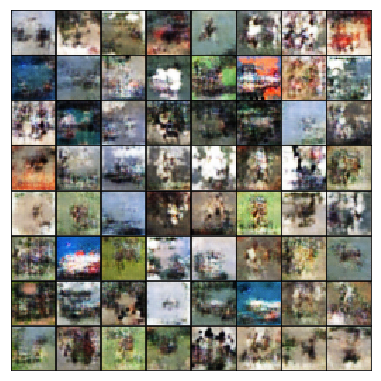

FID (different): 142.146
142.14639475085596


In [45]:
path_tosavedmodels='/content/drive/My Drive/ColabNotebooks/SAGAN_MODELS/generator.h5'
generator.load_weights(path_tosavedmodels)
noise_fid = np.random.normal(0, 1, size=(1300,100))
X_fake_fid = generator.predict([noise_fid, Y_train[0:1300]])
def plot_data(x,ax):
    ax.imshow((x+1)/2, cmap='gray') 
examples=64
dim=(1,1)
figsize=(2,2)
fig = plt.figure(figsize=(5,5))
fig.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0.01, wspace=0.01)
for i in range(examples):
  ax = fig.add_subplot(8,8, i+1, xticks=[], yticks=[])
  plot_data(X_fake_fid[i], ax)
plt.savefig('/content/drive/My Drive/ColabNotebooks/SAGAN_IMAGES/best.png')
plt.show()
plt.close()
fid_last=get_FID_score(X_test[0:1300],X_fake_fid,1300)
print(fid_last)


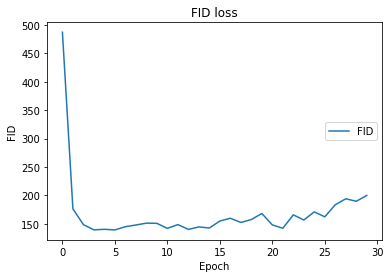

In [46]:
plt.plot(fid_sample)
plt.title('FID loss')
plt.ylabel('FID')
plt.xlabel('Epoch')
plt.legend(['FID'], loc='center right')
plt.show()